# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.
## 2. Data

The data we're using is from Kaggle's god breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images inthe training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [1]:

# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"


Get our workspace ready
* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅


In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version",tf.__version__)
print("TF Hub version", hub.__version__)

TF version 2.12.0
TF Hub version 0.14.0


In [3]:
# Check for GPU availability
print("GPU","available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU")else "not available :(")

GPU available (YESSSS!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print((labels_csv.head()))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

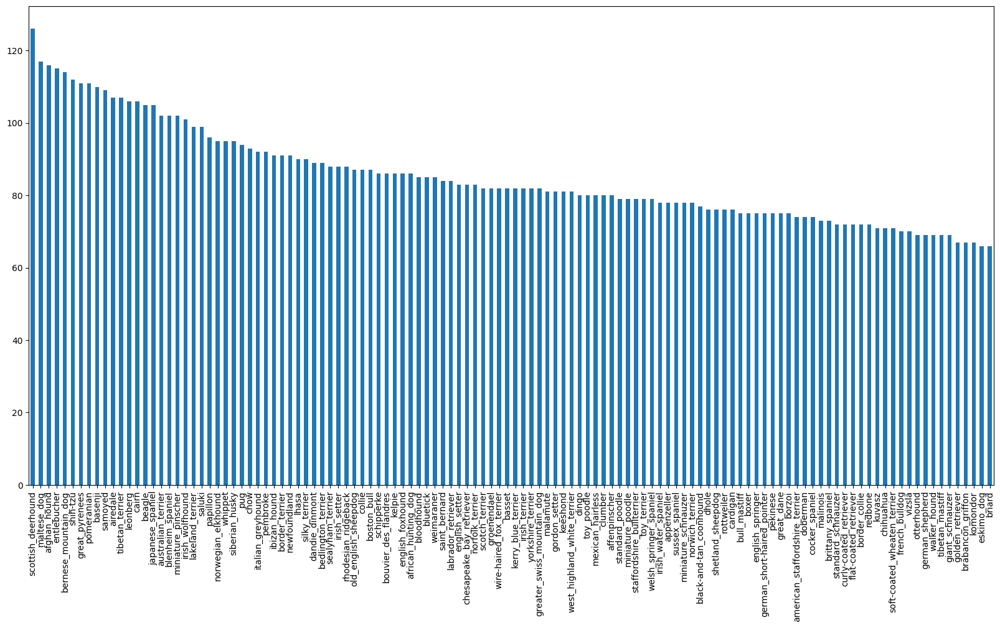

In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [7]:
labels_csv["breed"].value_counts().median()

82.0

In [8]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

FileNotFoundError: ignored

FileNotFoundError: ignored

<IPython.core.display.Image object>

### Getting images and their labels
Let's get a list of all of out image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Creat pathnames from image ID's
filenames= ["drive/My Drive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether number of filenames matched number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the ")

Filenames match actual amount of files!!! Proceed.


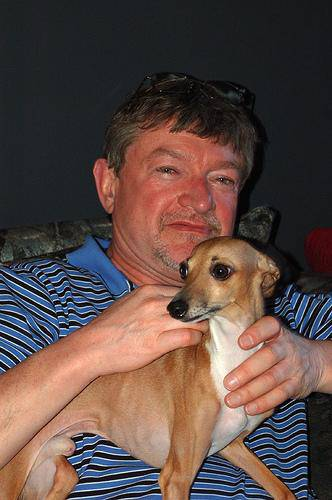

In [12]:
# One more check
Image(filenames[240])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list,
let's prepare our labels.

In [14]:
import numpy as np
labels=labels_csv["breed"]
#labels=np.array(labels) does same thing as above
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenamse
if len(labels)==len(filenames):
  print("matches")
else:
  print("not matches")

matches


In [17]:
# Find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [23]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set
, we're going to create our own

In [24]:
# Setup X and y variables
X=filenames
y=boolean_labels

In [25]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [26]:
# Set number of images to use for experimenting
NUM_IMAGES= 1000 #@param {type:"slider",min:1000,max=10000,step:1000}

In [27]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val,y_train, y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [28]:
# Let's have a geez at the training data
X_train[:5],y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Peprocessing Images (turning imags into Tensors)

To preprocess our images into Tensors we're going to write a functiion which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable ,`image`
3. Turn out `image` (a jpg) into Tensors.
4. Resize the `image` to be a shape of (224,224)
5. Return the modefied `image`.

Before we do, let's see what importing an image looks like.


In [29]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [30]:
image.max(), image.min()

(255, 0)

In [31]:
# Turn image into a tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [32]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

Now we've seen what an image looks lit as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable ,`image`
3. Turn out `image` (a jpg) into Tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,244)
6. Return the modefied `image`.

In [33]:
# Define image size
IMG_SIZE=224

# Create a fucntion for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

In [34]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [35]:
tensor=tf.image.decode_jpeg(tensor,channels=3)

In [36]:
tf.image.convert_image_dtype(tensor,tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go...they all might not fit into memory.

So that's why we do about 32 images (this is the batch size) at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`.

In [37]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and associated label, processes the image
  and returns a tupple of (image, label)
  """
  image= process_image(image_path)
  return image,label

In [38]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form:
`(image, label)`, let's make a function to turn all of our data (`X` & `y`) in
batches!

In [39]:
# Define the batch size,32 is a good start
BATCH_SIZE=32
# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE,valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validationa data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                            tf.constant(y))) # labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data =data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into a processed image)
    data=data.map(get_image_label)

    # Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch

In [40]:
# Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [41]:
# Check out the different attribute of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualising Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [42]:
import matplotlib.pyplot as plt
# Create a fucntion for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


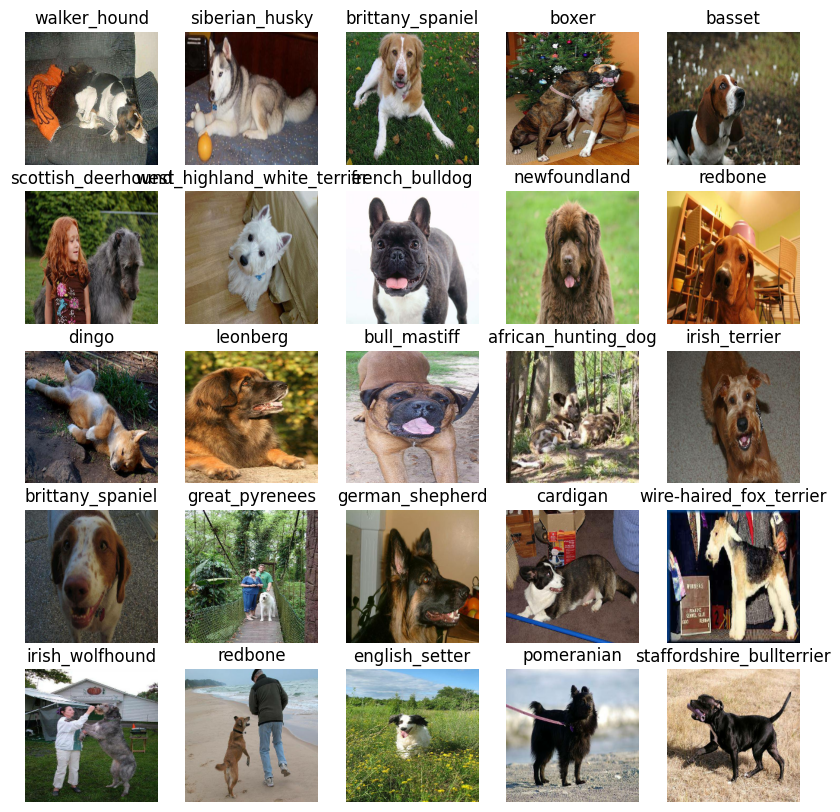

In [43]:
# Now let's visualize the data in a training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

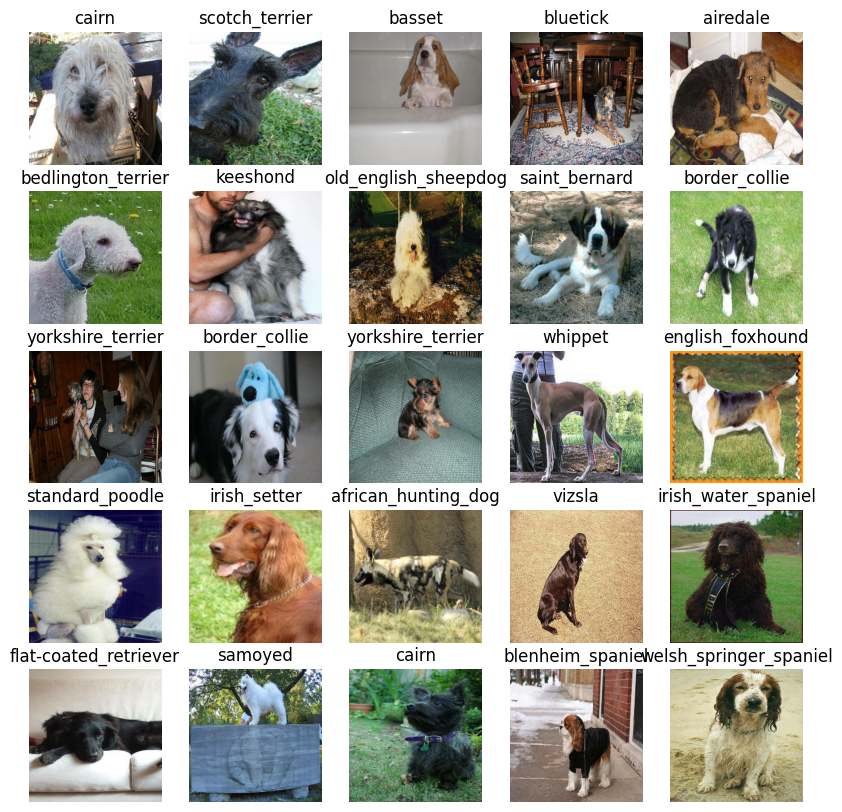

In [44]:
# Now let's visualize our validation set
val_images, val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model
Before we build a model, there are a few things we need to define"
* The input shape (our images shape, in form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model
* The URL of the model we want to use from TensorFlow Hub:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [45]:
# Setup input shape to the model
IMG_SIZE=224
INPUT_SHAPE=[None, IMG_SIZE,IMG_SIZE,3] # batch,height, width, color channels
# Setup output shap eof our model
OUTPUT_SHAPE=len(unique_breeds)
# Set up model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!
Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.




In [46]:
# Create a function which build a Keras model

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
               activation="softmax") # Layer 2 (output layer)

  ])


  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [47]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [48]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things
as save its progress, check its progress or stop training early if a
model stops improving.

Well create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.
### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `tensorboard` magic function (we'll do this after model training)

In [49]:
from keras.callbacks import TensorBoard
# Loag TensorBoard notebook extension
%load_ext tensorboard

In [50]:
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                      # Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [51]:
# Create early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on subset of data)

Our first model is only going to train ob 1000 images, to make sure everything is working.

In [52]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

In [53]:
# Check to make sure we're still running on a GPU
print(("GPU","available" if tf.config.list_physical_devices("GPU")else "not available"))

('GPU', 'available')


Let's create a function which trains a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()`function on our model passing it the training data, validataiion data, numbee of epochs train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [54]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard= create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # Return the fitted model
  return model

In [55]:
# Fit the model to the data
model=train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 180s 4s/step - loss: 4.5999 - accuracy: 0.0850 - val_loss: 3.3799 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 5s 183ms/step - loss: 1.6423 - accuracy: 0.6812 - val_loss: 2.1528 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 6s 223ms/step - loss: 0.5678 - accuracy: 0.9250 - val_loss: 1.6776 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 3s 130ms/step - loss: 0.2569 - accuracy: 0.9875 - val_loss: 1.5019 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1473 - accuracy: 0.9987 - val_loss: 1.4338 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1005 - accuracy: 0.9987 - val_loss: 1.3850 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?
**Note:** Overfitting to begin with a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [56]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [57]:
# Make predictions on validation data (not used to train on)
predictions= model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 4s 98ms/step


array([[1.4102904e-03, 6.5033571e-05, 2.9605220e-04, ..., 6.2424726e-05,
        1.9103649e-05, 1.5625879e-02],
       [3.2468741e-03, 9.3843520e-04, 1.8606376e-02, ..., 9.9197705e-04,
        5.0026824e-04, 1.3482392e-04],
       [6.3900561e-06, 2.2957140e-05, 3.2090802e-06, ..., 6.3207648e-05,
        6.5630287e-05, 4.2955035e-05],
       ...,
       [1.7190439e-06, 3.1399220e-05, 1.7529690e-04, ..., 3.3740737e-06,
        1.6899379e-04, 1.1312370e-05],
       [3.2930085e-03, 1.0346522e-03, 2.4986282e-05, ..., 8.3894825e-05,
        5.3419946e-05, 8.8456003e-03],
       [4.7515499e-04, 2.7635204e-05, 3.2857872e-04, ..., 3.1249484e-03,
        6.3406315e-04, 3.2092143e-05]], dtype=float32)

In [58]:
predictions.shape

(200, 120)

In [59]:
len(y_val)

200

In [60]:
len(unique_breeds)

120

In [61]:
len(predictions[0])

120

In [62]:
np.sum(predictions[1])

1.0

In [63]:
# First prediction
index=0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[1.41029037e-03 6.50335714e-05 2.96052196e-04 6.83980470e-05
 3.42205283e-04 2.51797246e-06 1.05562313e-02 1.20461606e-04
 2.15715772e-04 8.67661845e-04 6.06228423e-04 1.77890252e-05
 6.80033845e-05 2.31462782e-05 3.01757595e-04 5.39179367e-04
 5.41922636e-05 4.28878933e-01 3.20786103e-06 1.76046378e-04
 4.94471984e-04 5.54619008e-04 7.69711187e-05 5.88249532e-04
 1.08591092e-04 1.69220802e-04 2.22783238e-01 1.15005561e-04
 2.57476349e-04 3.25916713e-04 1.52393521e-04 3.33738513e-04
 1.09977543e-03 2.78577445e-05 1.14174261e-04 7.42852688e-03
 1.95547295e-06 1.16900774e-04 3.11552198e-04 1.33202979e-04
 4.04401729e-03 1.57711947e-05 2.58376258e-05 1.70639119e-04
 9.01109433e-06 9.84683138e-05 3.38199279e-05 5.45806979e-05
 1.81462429e-03 9.95763985e-05 2.31623762e-05 2.18230234e-05
 8.38897322e-05 1.75374924e-04 1.61583754e-04 3.60235863e-05
 3.38445789e-05 8.02444236e-04 6.65573636e-04 8.32507089e-02
 2.00019698e-04 2.59243079e-05 1.87333394e-03 1.73896424e-05
 7.26408558e-04 9.047679

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [64]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset,
we'll have to unbatchify it to make predictions on the validation image
and then compare those predictions to the validation labels (truth labels).

In [65]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images nad labels
  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
#Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [67]:
get_pred_label(val_labels[0])

'affenpinscher'

In [68]:
images_=[]
labels_=[]
# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [69]:
get_pred_label(labels_[0])

'cairn'

In [70]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images
Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted labeel, its predicted probability, the truth label and the target image on a single plot. ✅

In [71]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}{:2.0f}%{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

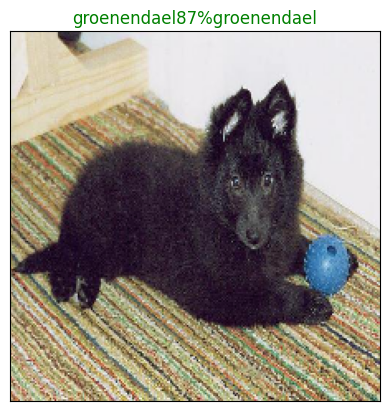

In [72]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, n=77)

Now we've got one function to visualize out models top predictionn, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer. ✅
* Find the prediction using `get_pred_label`✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [73]:
predictions[0].argsort()

array([ 36,   5,  18,  92,  44, 112,  41,  63,  11, 118,  51,  84,  13,
        50,  88, 115,  42,  61,  33,  46,  56, 101,  78,  55,  94,  16,
       107,  47, 117,   1, 108,  12,   3,  66,  91,  22,  75, 111,  52,
        45,  49,  82,  24,  34,  27,  37,   7,  67,  39,  30,  71,  54,
        25,  43,  53,  19,  60,  95,  98,   8, 110,  72, 104,  28,   2,
        14,  38,  86,  29,  31,  81,   4,  85,  69,  87,  99,  20, 113,
        74,  15,  21,  96,  23, 105,  10,  58,  80,  64,  57,   9, 114,
        93,  32,  89, 116,  90,   0,  83,  48,  97,  62,  76, 100,  40,
        73,  77,  70,  35,  65,   6, 106, 119,  68,  79, 102, 109, 103,
        59,  26,  17])

In [74]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

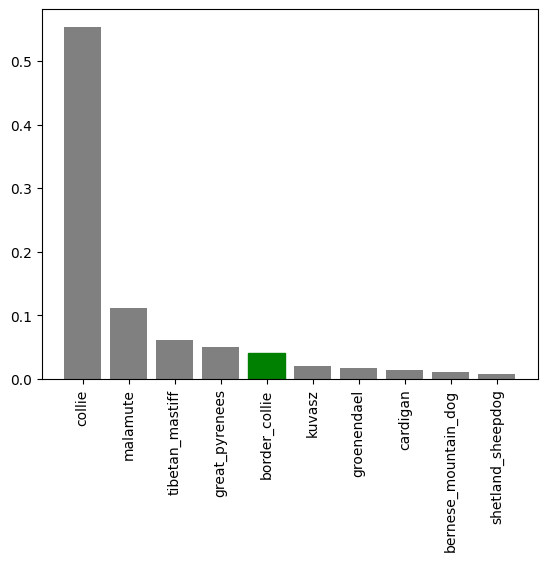

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

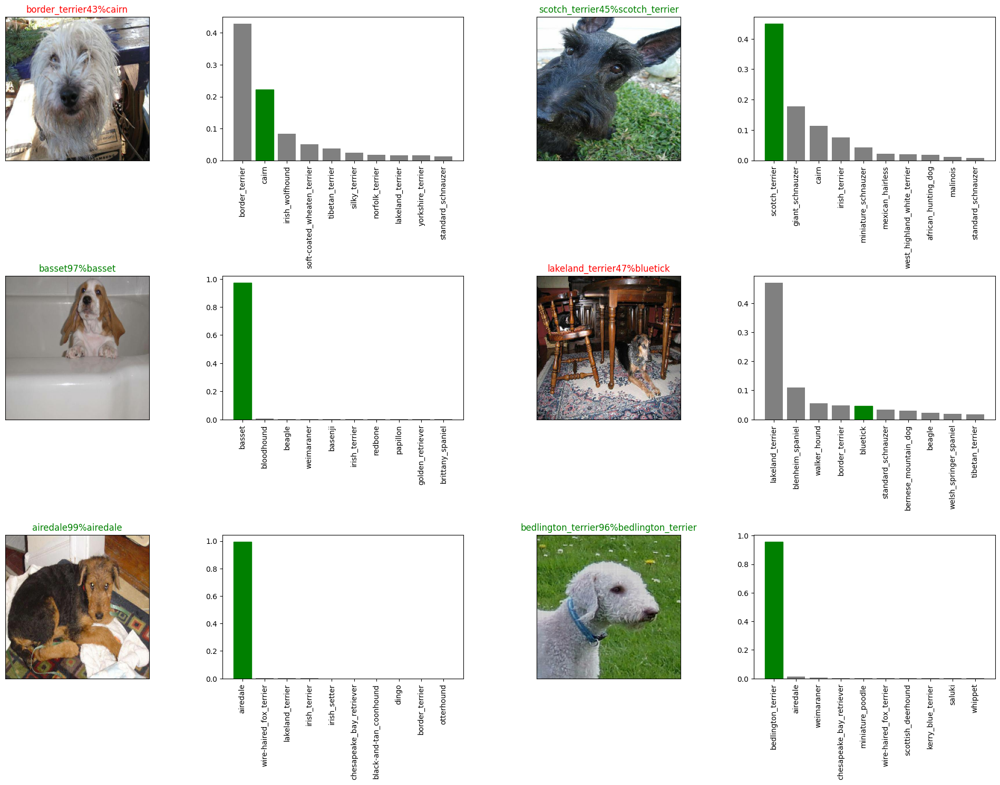

In [76]:
# Let's check out a few predictions and their different values
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge :** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model


In [77]:
# Create a function to save model
def save_model(model,suffix=None):
  """
  Saves a given model in models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir=os.path.join("/content/drive/MyDrive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%M%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5" #save format of model
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [78]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [79]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to:/content/drive/MyDrive/Dog Vision/models/20231119-00111689725471-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20231119-00111689725471-1000-images-mobilenetv2-Adam.h5'

In [80]:
from keras.saving.legacy.saved_model import load
# Load a trained model
loaded_1000_image_model=load_model("/content/drive/MyDrive/Dog Vision/models/20232413-04241689222264-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20232413-04241689222264-1000-images-mobilenetv2-Adam.h5


In [81]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 87ms/step - loss: 1.2525 - accuracy: 0.6450


[1.2525038719177246, 0.6449999809265137]

In [82]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 138ms/step - loss: 5.9492 - accuracy: 0.0050


[5.949182033538818, 0.004999999888241291]

## Training a big dog model 🐶 (on the full data)

In [83]:
len(X),len(y)

(10222, 10222)

In [84]:
len(X_train)

800

In [85]:
# Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [86]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [87]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [88]:
# Create full model callbacks
full_model_tensorboard= create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [89]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 123ms/step - loss: 1.3420 - accuracy: 0.6697
Epoch 2/100
320/320 [==============================] - 40s 124ms/step - loss: 0.4026 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 41s 127ms/step - loss: 0.2376 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1547 - accuracy: 0.9622
Epoch 5/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1061 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0771 - accuracy: 0.9881
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0593 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0478 - accuracy: 0.9927
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0361 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 35s 110m

In [90]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to:/content/drive/MyDrive/Dog Vision/models/20232619-00261689726400-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20232619-00261689726400-full-image-set-mobilenetv2-Adam.h5'

In [91]:
# Load in the full model
loaded_full_model=load_model('/content/drive/MyDrive/Dog Vision/models/20232619-00261689726400-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20232619-00261689726400-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained in the form of Tensor batches, to make predictions on the test data, we'll have to get it in the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenamees as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True`(since the test data doesn't have labels).✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [93]:
# Load test image filenames
test_path="/content/drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e073f14cd5f4c1a62cdb0108cca62fdd.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dfc9bcbafc1e249cd07a25c8f50384e0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6343c835d2d07d7f3ac962b92415743.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd51cac7c6e1e091b26545aec86dabf3.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e596c0d97b381e876d46dda2eb60074c.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4235f4b313a4b49946938992dd95249.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e09859cae41cb59228518c09c3b27362.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e312dda8d35118c40880c0f331c09509.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e5b13519aa192a386dc0c5dd7d096e70.jpg']

In [95]:
# Create test dat batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [96]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [97]:
# Make predictions on test data batch using the loaded full model
test_predictions= loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 1199s 4s/step


In [104]:
# Save predictiions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [105]:
test_predictions=np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter=",")

In [106]:
test_predictions[:10]

array([[1.83101498e-08, 1.11097598e-11, 2.16560436e-09, ...,
        1.66268146e-05, 5.32754896e-10, 8.55356841e-10],
       [7.81939917e-08, 9.62221747e-10, 4.26067265e-10, ...,
        5.35679383e-11, 5.45580958e-09, 3.57176297e-08],
       [1.68649171e-06, 2.16180962e-09, 2.04651829e-09, ...,
        3.25283955e-09, 1.53780363e-07, 5.95158711e-02],
       ...,
       [1.54577490e-12, 4.94069299e-11, 1.74583492e-09, ...,
        2.61747540e-10, 2.85373680e-08, 4.96795716e-10],
       [3.76869036e-10, 2.58723740e-14, 5.73783451e-11, ...,
        4.47108930e-13, 1.66447897e-11, 1.53124895e-13],
       [3.62804092e-11, 1.87399263e-11, 6.08207512e-11, ...,
        3.56204777e-09, 1.41769083e-12, 6.44295554e-12]])

In [107]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with and ID and a column for each different dog breed.✅
To get the data in this format, we'll:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [108]:
# Create a pandas DataFrame with empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [112]:
# Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [114]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e073f14cd5f4c1a62cdb0108cca62fdd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfc9bcbafc1e249cd07a25c8f50384e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6343c835d2d07d7f3ac962b92415743,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dd51cac7c6e1e091b26545aec86dabf3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,1.831015e-08,1.110976e-11,2.165604e-09,3.550641e-09,3.628137e-07,1.364372e-08,1.174442e-10,6.977508e-09,2.852636e-11,...,1.350677e-09,2.531101e-08,4.058613e-08,5.898758e-10,5.130135e-09,9.799730e-12,7.592929e-10,1.662681e-05,5.327549e-10,8.553568e-10
1,e073f14cd5f4c1a62cdb0108cca62fdd,7.819399e-08,9.622217e-10,4.260673e-10,4.019196e-09,7.447627e-09,1.654128e-07,4.979574e-08,2.207232e-09,1.521633e-08,...,1.070844e-07,1.148954e-09,1.444329e-08,8.700575e-11,1.156476e-09,3.509209e-06,6.499287e-11,5.356794e-11,5.455810e-09,3.571763e-08
2,dfc9bcbafc1e249cd07a25c8f50384e0,1.686492e-06,2.161810e-09,2.046518e-09,5.518780e-07,1.724242e-07,4.737848e-09,9.392732e-01,2.046386e-07,2.655600e-09,...,5.264116e-08,9.419490e-05,7.064684e-08,2.237350e-07,1.227285e-09,2.451054e-08,2.535256e-06,3.252840e-09,1.537804e-07,5.951587e-02
3,e6343c835d2d07d7f3ac962b92415743,1.411450e-07,1.203733e-08,7.369894e-08,3.345540e-05,3.444522e-06,2.976755e-06,6.799417e-08,1.981832e-09,1.392525e-06,...,5.603203e-08,1.348303e-07,2.478558e-06,2.084935e-06,7.232674e-07,2.268236e-06,5.605306e-04,1.324644e-06,8.171774e-01,1.660085e-06
4,dd51cac7c6e1e091b26545aec86dabf3,8.981662e-08,6.015846e-13,4.386981e-09,3.419708e-12,7.018892e-05,4.082516e-12,5.568573e-11,1.243415e-08,5.781870e-07,...,1.284298e-07,4.035228e-06,4.051827e-09,2.397442e-10,5.093288e-09,2.505297e-09,2.925619e-07,6.886065e-10,7.190062e-09,1.675621e-09


In [118]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()` and since our
custom images won't have labels, we set the  `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilites to prediction labels.
* Compare the predicted labels to the custom images.

In [148]:
# Get custom image filtpaths
custom_path="/content/drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/My Drive/Dog Vision/my-dog-photos/dogi3.jpeg',
 '/content/drive/My Drive/Dog Vision/my-dog-photos/dogi2.jpeg',
 '/content/drive/My Drive/Dog Vision/my-dog-photos/dogi.jpeg']

In [149]:
# Turn custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [150]:
# Make predictions on the custom data

custom_preds = loaded_full_model.predict(custom_data)


1/1 [==============================] - 1s 557ms/step


In [152]:
custom_preds.shape

(3, 120)

In [154]:
# Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i])for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'eskimo_dog', 'golden_retriever']

In [155]:
# Get custom images (our unbatchify() function won't work since there aren't labels ... maybe we could fix this later)
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

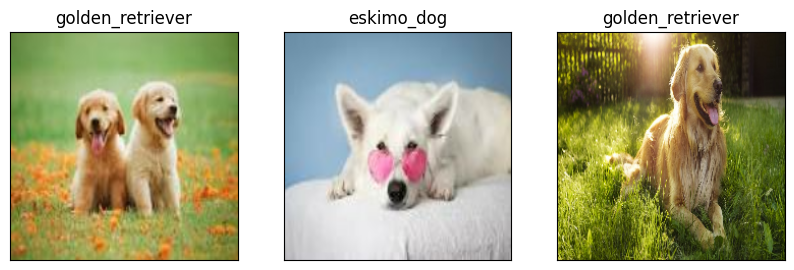

In [156]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)